In [49]:
import numpy as np
import os
import segyio
import glob

from pyfrac.visualisation.plotting_support import explode_volume

%matplotlib inline
import matplotlib.pyplot as plt

In [51]:
local_modpath = '/home/birniece/Documents/data/ANPERC_Lab/STYLOLITES/StyloliteModels'

seispath = '/home/birniece/Documents/Projects/MicroseismicModelling/ShaheenTransfers/INCOMING/Stylolites/outputs/su'
figpath = './Figures/StyloliteWaveforms/'

In [40]:
def traceimage(data, norm_indiv=False, figsize=[12, 6], cbar=True, clim=1, cmap='seismic', ax=None):
    if norm_indiv:
        data = (data.T / np.max(abs(data), axis=1)).T        

    # clim = np.percentile(abs(data), climQ)

    
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=figsize)
    im = ax.imshow(data.T, aspect='auto', interpolation=None,
                   cmap=cmap, vmin=-1 * clim, vmax=clim)
    if cbar: plt.colorbar(im, ax=ax, label='Seis. Amp.')
    ax.set_xlabel('Receiver #')
    ax.set_ylabel('Time')
    ax.set_title('Seismic Recording')
    ax.axis('tight')
    if ax is None: fig.tight_layout()

    return ax

In [8]:
def read_seis(seisfile, nr):
    # s_wave_file = os.path.join(data_path,'test.bin.curl')
    seis_flat = np.loadtxt(seisfile)

    # determine number of timesamples and ensure it saved fully
    nt = int(seis_flat.shape[0] / nr)
    try:
        seis_flat.reshape((nr, nt))
    except:
        print('Not good dims \n nt:%i nr:%i \n vz flat:%i' % (nt, nr, seis_flat.shape[0]))

    # Resample to 2D
    seis = seis_flat[:nt * nr].reshape((nr, nt))
    return seis

In [9]:
nr = 150

In [60]:
model_files = glob.glob(local_modpath+'/*pc90.vp')
exp_list = [m.split('/')[-1][:-8] for m in model_files]
exp_list

['InclinedStylo_a45',
 'InclinedStylo_a-45',
 'InclinedStylo_a-35',
 'StraightStylo_w05',
 'InclinedStylo_a25',
 'InclinedStylo_a-25',
 'InclinedStylo_a35',
 'StraightStylo_w03',
 'StraightStylo_w01',
 'SineStylo_h05',
 'StraightStylo_w04',
 'PinchOutStylo',
 'SineStylo_h20',
 'StraightStylo_w02',
 'InclinedStylo_a15',
 'SineStylo_h10',
 'SineStylo_h15',
 'InclinedStylo_a-05',
 'InclinedStylo_a05',
 'InclinedStylo_a-15']

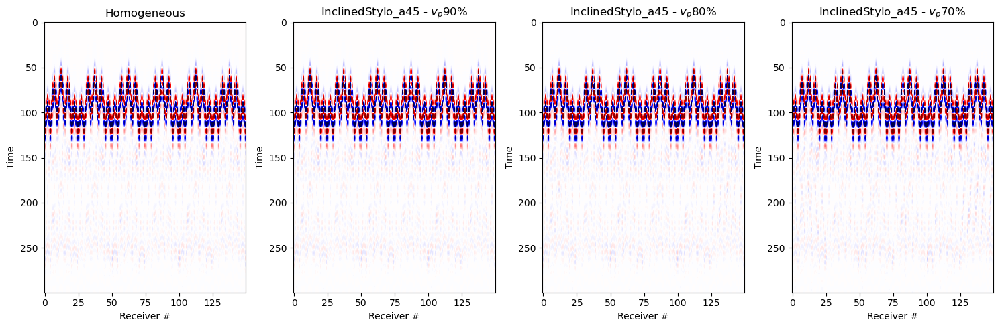

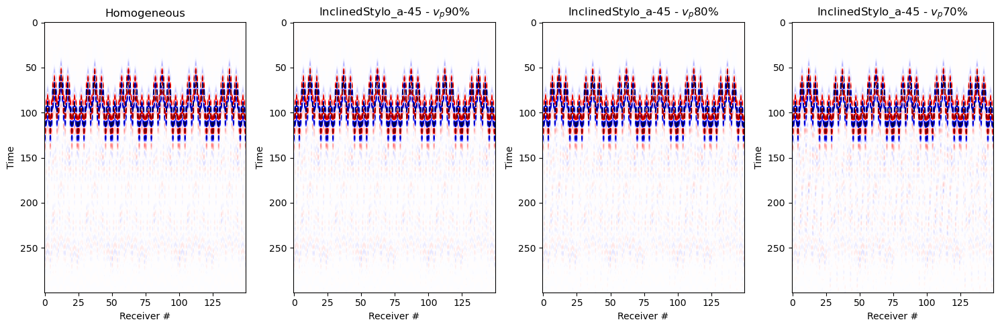

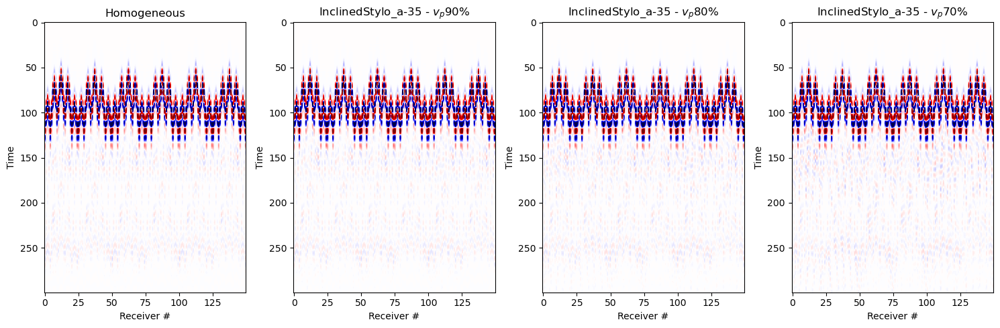

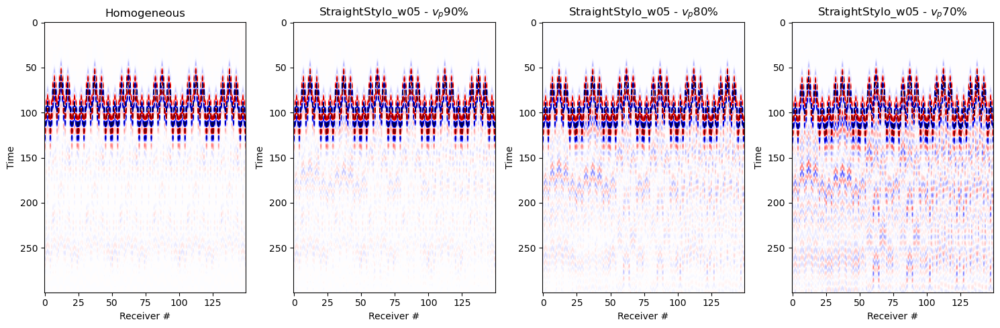

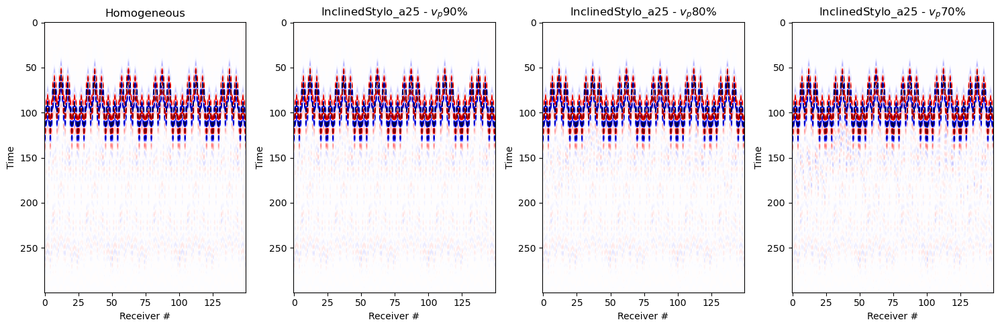

...

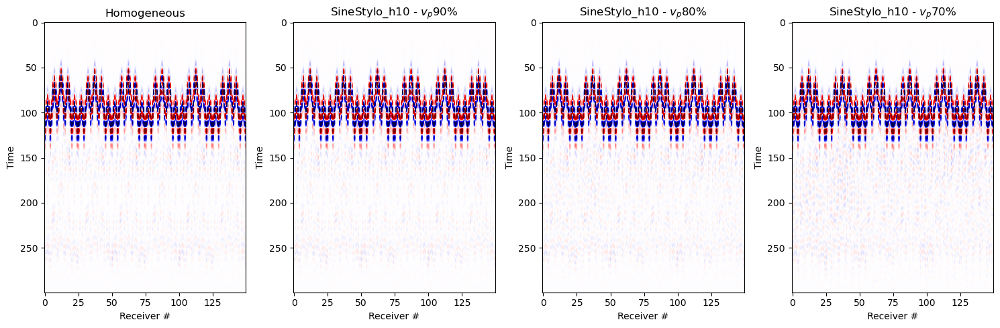

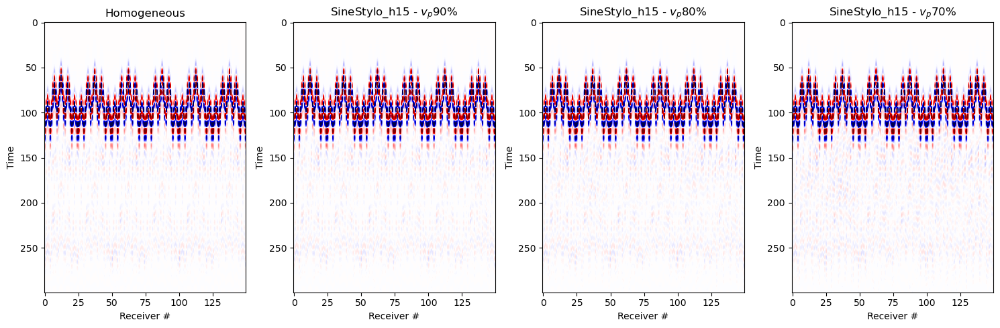

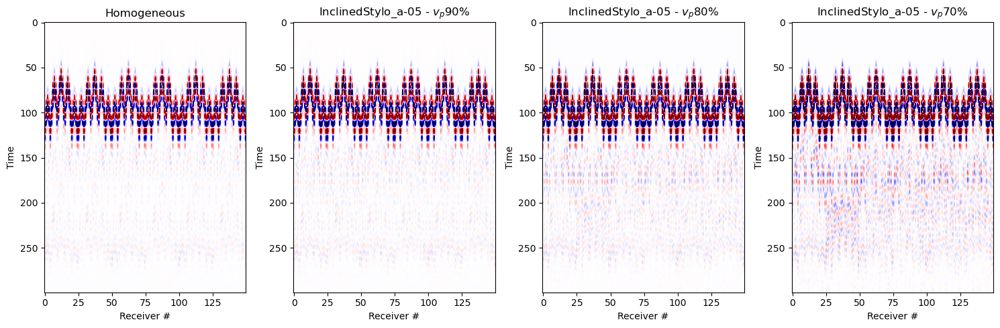

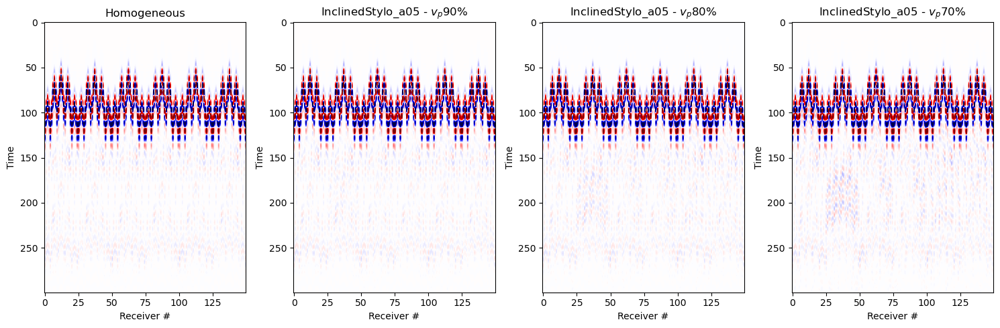

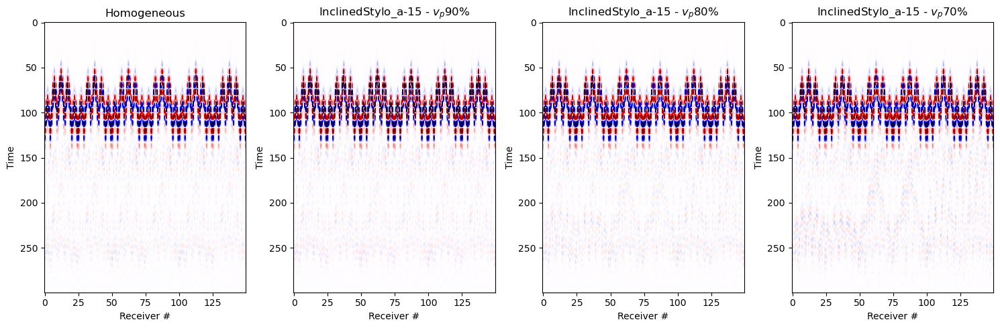

In [62]:
exp = 'SineStylo_h15'
for exp in exp_list:
    homo_div  = read_seis(os.path.join(seispath,'Homogeneous_div.txt'), nr)
    p90_div  = read_seis(os.path.join(seispath,'%s_pc90_div.txt'%exp), nr)
    p80_div  = read_seis(os.path.join(seispath,'%s_pc80_div.txt'%exp), nr)
    p70_div  = read_seis(os.path.join(seispath,'%s_pc70_div.txt'%exp), nr)
    
    vmax = 5e3
    
    fig,axs = plt.subplots(1,4, figsize=[15,5])
    traceimage(homo_div[:,50:350], clim=vmax, ax=axs[0], cbar=False)
    traceimage(p90_div[:,50:350], clim=vmax, ax=axs[1], cbar=False)
    traceimage(p80_div[:,50:350], clim=vmax, ax=axs[2], cbar=False)
    traceimage(p70_div[:,50:350], clim=vmax, ax=axs[3], cbar=False)
    
    axs[0].set_title('Homogeneous')
    axs[1].set_title(exp + r' - $v_p 90\%$')
    axs[2].set_title(exp + r' - $v_p 80\%$')
    axs[3].set_title(exp + r' - $v_p 70\%$')
    fig.tight_layout()
    fig.savefig(os.path.join(figpath,exp+'.png'), format='png')

In [82]:
def get_FB_Coda_Energy(data, nr, fblim=1e-4, wavelength = 75):
    # Find First Breaks
    fblim = 1e-8
    
    fb_locs = np.zeros([nr])
    fb_energy = np.zeros([nr])
    coda_energy = np.zeros([nr])
    
    for tr in range(nr):
        fb_locs[tr] = [n for n,i in enumerate(data[tr]) if abs(i)>fblim][0]
        
    for tr in range(nr):    
        fb_energy[tr] = np.sum(data[tr,int(fb_locs[tr]):int(fb_locs[tr])+wavelength]**2)
        coda_energy[tr] = np.sum(data[tr,int(fb_locs[tr])+wavelength:]**2)
    
    return fb_energy, coda_energy

In [86]:
fb_energy.shape

(900,)

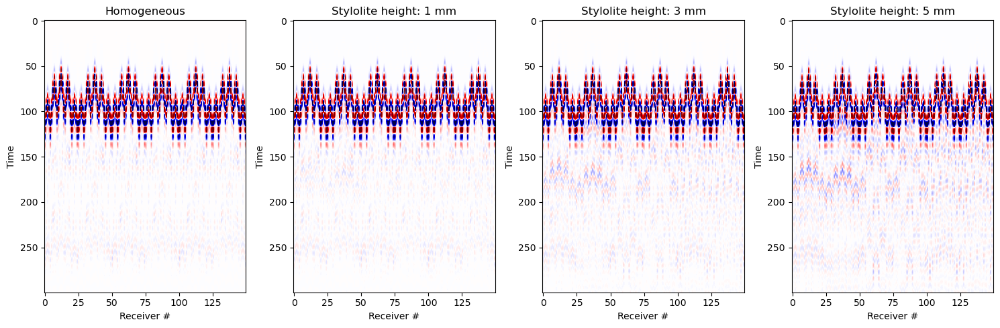

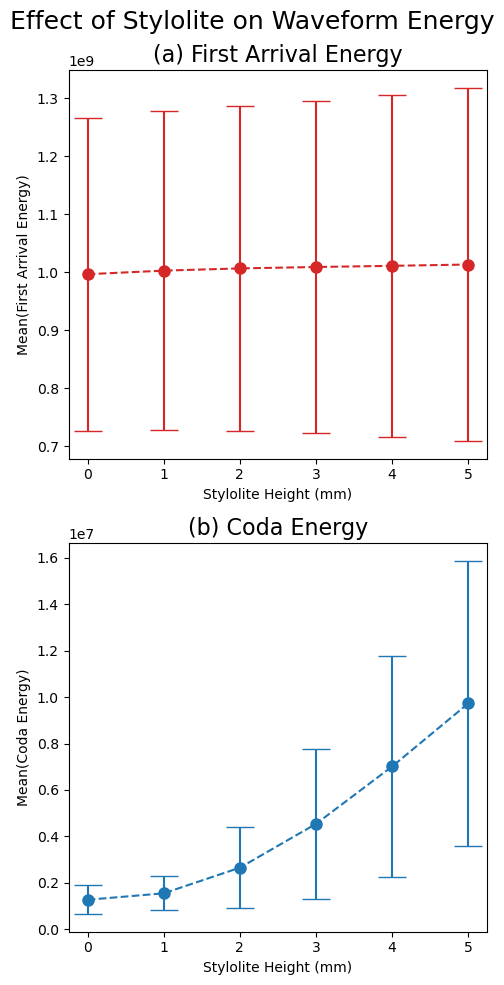

In [91]:
# Increasing Thickness
homo_div  = read_seis(os.path.join(seispath,'Homogeneous_div.txt'), nr)
w1_div  = read_seis(os.path.join(seispath,'StraightStylo_w01_pc80_div.txt'), nr)
w2_div  = read_seis(os.path.join(seispath,'StraightStylo_w02_pc80_div.txt'), nr)
w3_div  = read_seis(os.path.join(seispath,'StraightStylo_w03_pc80_div.txt'), nr)
w4_div  = read_seis(os.path.join(seispath,'StraightStylo_w04_pc80_div.txt'), nr)
w5_div  = read_seis(os.path.join(seispath,'StraightStylo_w05_pc80_div.txt'), nr)

vmax = 5e3

fig,axs = plt.subplots(1,4, figsize=[15,5])
traceimage(homo_div[:,50:350], clim=vmax, ax=axs[0], cbar=False)
traceimage(w1_div[:,50:350], clim=vmax, ax=axs[1], cbar=False)
traceimage(w3_div[:,50:350], clim=vmax, ax=axs[2], cbar=False)
traceimage(w5_div[:,50:350], clim=vmax, ax=axs[3], cbar=False)

axs[0].set_title('Homogeneous')
axs[1].set_title('Stylolite height: 1 mm')
axs[2].set_title('Stylolite height: 3 mm')
axs[3].set_title('Stylolite height: 5 mm')
fig.tight_layout()
fig.savefig(os.path.join(figpath,'VaryingThickness.png'), format='png')

homo_fb_energy, homo_coda_energy = get_FB_Coda_Energy(homo_div, nr)
w1_fb_energy, w1_coda_energy = get_FB_Coda_Energy(w1_div, nr)
w2_fb_energy, w2_coda_energy = get_FB_Coda_Energy(w2_div, nr)
w3_fb_energy, w3_coda_energy = get_FB_Coda_Energy(w3_div, nr)
w4_fb_energy, w4_coda_energy = get_FB_Coda_Energy(w4_div, nr)
w5_fb_energy, w5_coda_energy = get_FB_Coda_Energy(w5_div, nr)


fb_energy = np.vstack([homo_fb_energy, w1_fb_energy, w2_fb_energy, w3_fb_energy, w4_fb_energy, w5_fb_energy,])
coda_energy = np.vstack([homo_coda_energy, w1_coda_energy, w2_coda_energy, w3_coda_energy, w4_coda_energy, w5_coda_energy,])
t = range(len(fb_energy))

fig, axs = plt.subplots(2,1,figsize=[5,10])

for ax in axs: ax.set_xticks([0,1,2,3,4,5],labels=[0,1,2,3,4,5]); ax.set_xlabel('Stylolite Height (mm)')

color = 'tab:red'
axs[0].set_title('(a) First Arrival Energy', fontsize=16)
axs[0].set_ylabel('Mean(First Arrival Energy)')
axs[0].errorbar(t, np.mean(fb_energy,axis=1), yerr=np.std(fb_energy,axis=1),
             ls='--', color=color, fmt='o', markersize=8, capsize=10)

color = 'tab:blue'
axs[1].errorbar(t, np.mean(coda_energy,axis=1), yerr=np.std(coda_energy,axis=1),
             ls='--', color=color, fmt='o', markersize=8, capsize=10)
axs[1].set_title('(b) Coda Energy', fontsize=16)
axs[1].set_ylabel('Mean(Coda Energy)')

plt.suptitle('Effect of Stylolite on Waveform Energy', fontsize=18)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(os.path.join(figpath,'VaryingThickness_EnergyPlots.png'), format='png')

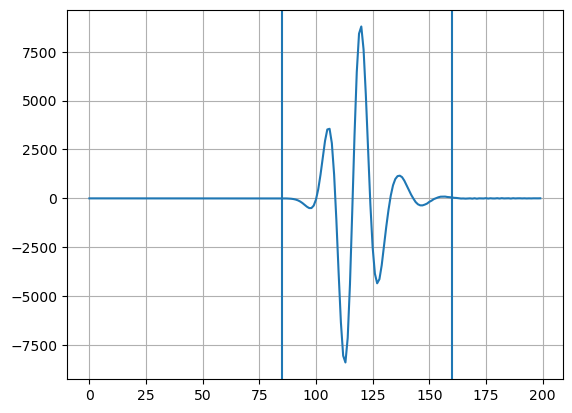

In [80]:
fig,ax = plt.subplots(1,1)
ax.plot(homo_div[0][50:250])
ax.axvline(85)
ax.axvline(160)
plt.grid()

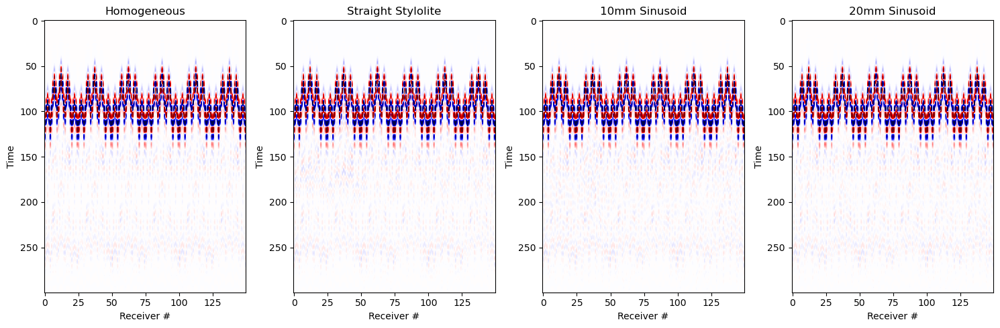

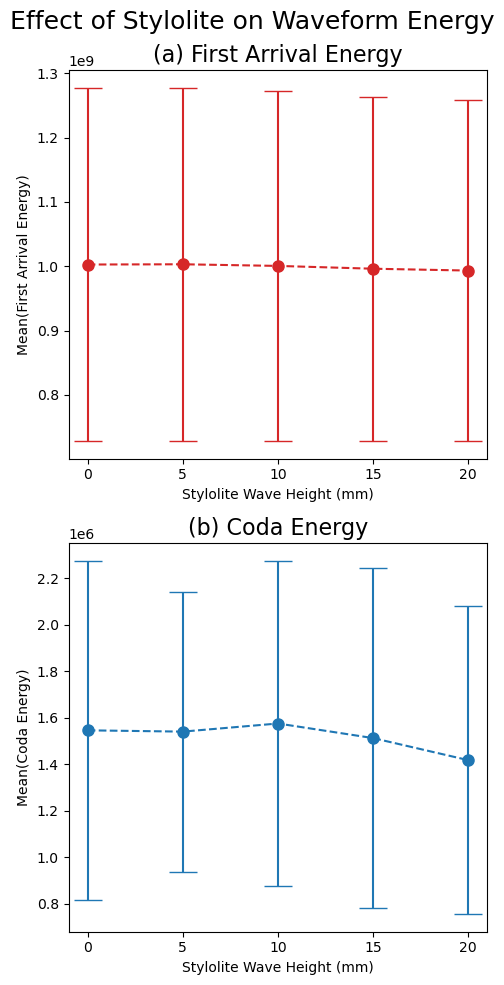

In [92]:
# Increasing Height
homo_div  = read_seis(os.path.join(seispath,'Homogeneous_div.txt'), nr)
strt_div  = read_seis(os.path.join(seispath,'StraightStylo_w01_pc80_div.txt'), nr)
h5_div  = read_seis(os.path.join(seispath,'SineStylo_h05_pc80_div.txt'), nr)
h10_div  = read_seis(os.path.join(seispath,'SineStylo_h10_pc80_div.txt'), nr)
h15_div  = read_seis(os.path.join(seispath,'SineStylo_h15_pc80_div.txt'), nr)
h20_div  = read_seis(os.path.join(seispath,'SineStylo_h20_pc80_div.txt'), nr)

vmax = 5e3

fig,axs = plt.subplots(1,4, figsize=[15,5])
traceimage(homo_div[:,50:350], clim=vmax, ax=axs[0], cbar=False)
traceimage(strt_div[:,50:350], clim=vmax, ax=axs[1], cbar=False)
traceimage(h10_div[:,50:350], clim=vmax, ax=axs[2], cbar=False)
traceimage(h20_div[:,50:350], clim=vmax, ax=axs[3], cbar=False)

axs[0].set_title('Homogeneous')
axs[1].set_title('Straight Stylolite')
axs[2].set_title('10mm Sinusoid')
axs[3].set_title('20mm Sinusoid')
fig.tight_layout()
fig.savefig(os.path.join(figpath,'VaryingHeightSine.png'), format='png')



homo_fb_energy, homo_coda_energy = get_FB_Coda_Energy(strt_div, nr)
w1_fb_energy, w1_coda_energy = get_FB_Coda_Energy(h5_div, nr)
w2_fb_energy, w2_coda_energy = get_FB_Coda_Energy(h10_div, nr)
w3_fb_energy, w3_coda_energy = get_FB_Coda_Energy(h15_div, nr)
w4_fb_energy, w4_coda_energy = get_FB_Coda_Energy(h20_div, nr)

fb_energy = np.vstack([homo_fb_energy, w1_fb_energy, w2_fb_energy, w3_fb_energy, w4_fb_energy, ])
coda_energy = np.vstack([homo_coda_energy, w1_coda_energy, w2_coda_energy, w3_coda_energy, w4_coda_energy,])
t = range(len(fb_energy))

fig, axs = plt.subplots(2,1,figsize=[5,10])

for ax in axs: ax.set_xticks([0,1,2,3,4],labels=[0,5,10,15,20]); ax.set_xlabel('Stylolite Wave Height (mm)')

color = 'tab:red'
axs[0].set_title('(a) First Arrival Energy', fontsize=16)
axs[0].set_ylabel('Mean(First Arrival Energy)')
axs[0].errorbar(t, np.mean(fb_energy,axis=1), yerr=np.std(fb_energy,axis=1),
             ls='--', color=color, fmt='o', markersize=8, capsize=10)

color = 'tab:blue'
axs[1].errorbar(t, np.mean(coda_energy,axis=1), yerr=np.std(coda_energy,axis=1),
             ls='--', color=color, fmt='o', markersize=8, capsize=10)
axs[1].set_title('(b) Coda Energy', fontsize=16)
axs[1].set_ylabel('Mean(Coda Energy)')

plt.suptitle('Effect of Stylolite on Waveform Energy', fontsize=18)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(os.path.join(figpath,'VaryingHeightSine_EnergyPlots.png'), format='png')

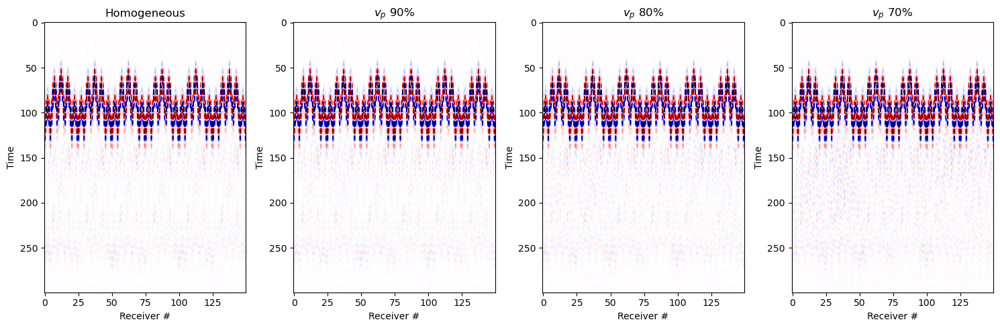

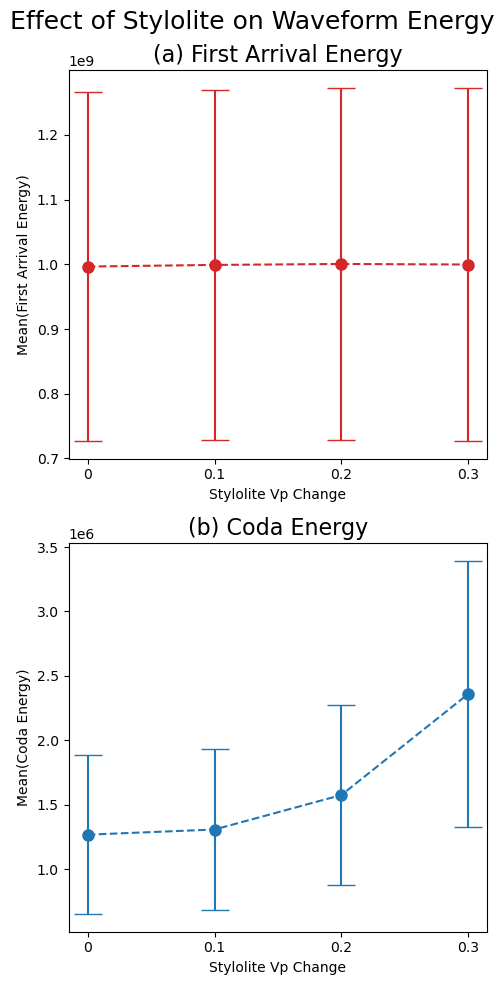

In [93]:
exp = 'SineStylo_h10'
homo_div  = read_seis(os.path.join(seispath,'Homogeneous_div.txt'), nr)
p90_div  = read_seis(os.path.join(seispath,'%s_pc90_div.txt'%exp), nr)
p80_div  = read_seis(os.path.join(seispath,'%s_pc80_div.txt'%exp), nr)
p70_div  = read_seis(os.path.join(seispath,'%s_pc70_div.txt'%exp), nr)

vmax = 5e3

fig,axs = plt.subplots(1,4, figsize=[15,5])
traceimage(homo_div[:,50:350], clim=vmax, ax=axs[0], cbar=False)
traceimage(p90_div[:,50:350], clim=vmax, ax=axs[1], cbar=False)
traceimage(p80_div[:,50:350], clim=vmax, ax=axs[2], cbar=False)
traceimage(p70_div[:,50:350], clim=vmax, ax=axs[3], cbar=False)

axs[0].set_title('Homogeneous')
axs[1].set_title(r'$v_p$ $90\%$')
axs[2].set_title(r'$v_p$ $80\%$')
axs[3].set_title(r'$v_p$ $70\%$')
fig.tight_layout()
fig.savefig(os.path.join(figpath,'VaryingProperties.png'), format='png')


homo_fb_energy, homo_coda_energy = get_FB_Coda_Energy(homo_div, nr)
w1_fb_energy, w1_coda_energy = get_FB_Coda_Energy(p90_div, nr)
w2_fb_energy, w2_coda_energy = get_FB_Coda_Energy(p80_div, nr)
w3_fb_energy, w3_coda_energy = get_FB_Coda_Energy(p70_div, nr)

fb_energy = np.vstack([homo_fb_energy, w1_fb_energy, w2_fb_energy, w3_fb_energy,  ])
coda_energy = np.vstack([homo_coda_energy, w1_coda_energy, w2_coda_energy, w3_coda_energy, ])
t = range(len(fb_energy))

fig, axs = plt.subplots(2,1,figsize=[5,10])

for ax in axs: ax.set_xticks([0,1,2,3],labels=[0,0.1,0.2,0.3]); ax.set_xlabel('Stylolite Vp Change')

color = 'tab:red'
axs[0].set_title('(a) First Arrival Energy', fontsize=16)
axs[0].set_ylabel('Mean(First Arrival Energy)')
axs[0].errorbar(t, np.mean(fb_energy,axis=1), yerr=np.std(fb_energy,axis=1),
             ls='--', color=color, fmt='o', markersize=8, capsize=10)

color = 'tab:blue'
axs[1].errorbar(t, np.mean(coda_energy,axis=1), yerr=np.std(coda_energy,axis=1),
             ls='--', color=color, fmt='o', markersize=8, capsize=10)
axs[1].set_title('(b) Coda Energy', fontsize=16)
axs[1].set_ylabel('Mean(Coda Energy)')

plt.suptitle('Effect of Stylolite on Waveform Energy', fontsize=18)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(os.path.join(figpath,'VaryingPropertie_EnergyPlots.png'), format='png')